# **COVID 19 Indonesia Geospatial - Tugas 9 Visualisasi Data** 

- Nama : Kurniadi Ahmad Wijaya
- NIM : 1301194024
- Kelas : IF-42-GAB06 / IF-43-09

In [ ]:
!pip install geopandas

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import requests
import imageio
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import datetime
import pathlib

from matplotlib import cm
from tqdm import tqdm

In [ ]:
indonesia = gpd.read_file("/content/drive/MyDrive/geoindo/Batas Provinsi.shp")
indonesia.head()

,No,Kode_Prov,Provinsi,geometry
0,11.0,52,NUSA TENGGARA BARAT,"MULTIPOLYGON (((118.72881 -8.35901, 118.72886 ..."
1,22.0,53,NUSA TENGGARA TIMUR,"MULTIPOLYGON (((122.65419 -8.63712, 122.62966 ..."
2,25.0,63,KALIMANTAN SELATAN,"MULTIPOLYGON (((114.88632 -2.50353, 114.91290 ..."
3,27.0,65,KALIMANTAN UTARA,"MULTIPOLYGON (((116.58930 4.37422, 116.61513 4..."
4,30.0,76,SULAWESI BARAT,"MULTIPOLYGON (((119.86380 -1.96121, 119.87027 ..."


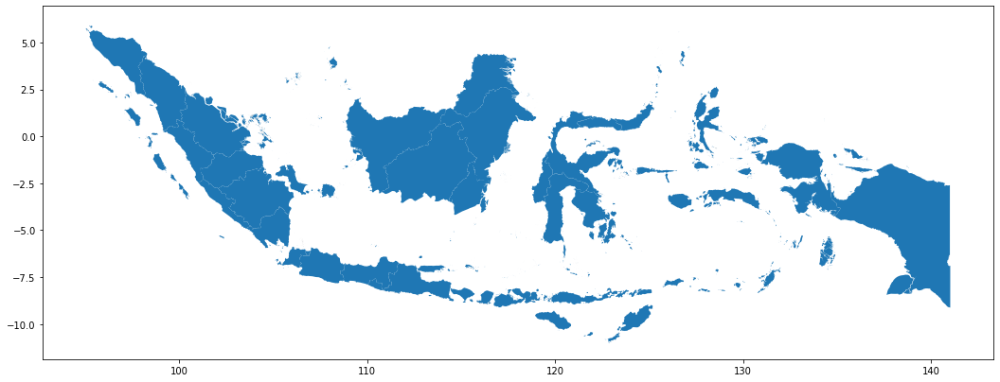

In [ ]:
indonesia.plot(figsize=(18, 16))

In [ ]:
province = list(indonesia['Provinsi'])

province_u = lambda x: x.replace(' ', '_')
province_u = list(map(province_u, province))

In [ ]:
dataset_pure = []

for i in tqdm(range(len(province))):
    response = requests.get(f'https://data.covid19.go.id/public/api/prov_detail_{province_u[i]}.json')
    response = response.json().get('list_perkembangan')

    dataset_pure.append([province[i], response])

100%|██████████| 34/34 [00:35<00:00,  1.04s/it]


In [ ]:
dataset = dataset_pure.copy()
df_list = []

for i in range(len(dataset)):
    for j in range(len(dataset[i][1])): 
        dataset[i][1][j]['PROVINSI'] = dataset[i][0]

    df_list.append(pd.DataFrame(dataset[i][1]))    

df = pd.concat(df_list)

In [ ]:
def convert_timestamp(time):
    return datetime.datetime.fromtimestamp(time / 1000.0)

df['tanggal'] = df['tanggal'].apply(convert_timestamp)

start = "2021-05-01"
end = "2021-10-20"

df = df.loc[(df['tanggal'] >= start) & (df['tanggal'] <= end)]
df.sample(8)

,tanggal,KASUS,MENINGGAL,SEMBUH,DIRAWAT_OR_ISOLASI,AKUMULASI_KASUS,AKUMULASI_SEMBUH,AKUMULASI_MENINGGAL,AKUMULASI_DIRAWAT_OR_ISOLASI,PROVINSI
425,2021-05-13,80,2,84,-6,69954,67007,1682,1265,KALIMANTAN TIMUR
507,2021-08-30,15,8,89,-82,11174,9891,416,867,GORONTALO
526,2021-08-31,102,9,390,-297,57969,52831,2887,2251,SUMATERA SELATAN
521,2021-08-19,1175,57,2119,-1001,142075,115882,4461,21732,DAERAH ISTIMEWA YOGYAKARTA
532,2021-09-02,267,28,625,-386,105202,98287,2053,4862,SULAWESI SELATAN
522,2021-08-26,8,0,209,-201,14273,13252,249,772,MALUKU
445,2021-05-30,42,2,42,-2,47215,45050,1501,664,BALI
529,2021-08-14,2443,39,2216,188,653606,580558,11358,61690,JAWA BARAT


### **Merge Dataset**

In [ ]:
df_covid_indonesia = indonesia.set_index('Provinsi').join(df.set_index('PROVINSI'))
df_covid_indonesia.head()

,No,Kode_Prov,geometry,tanggal,KASUS,MENINGGAL,SEMBUH,DIRAWAT_OR_ISOLASI,AKUMULASI_KASUS,AKUMULASI_SEMBUH,AKUMULASI_MENINGGAL,AKUMULASI_DIRAWAT_OR_ISOLASI
ACEH,1.0,11,"MULTIPOLYGON (((98.07694 2.57227, 98.08125 2.5...",2021-05-01,124,2,118,4,11169,9727,441,1001
ACEH,1.0,11,"MULTIPOLYGON (((98.07694 2.57227, 98.08125 2.5...",2021-05-02,68,7,52,9,11237,9779,448,1010
ACEH,1.0,11,"MULTIPOLYGON (((98.07694 2.57227, 98.08125 2.5...",2021-05-03,56,1,14,41,11293,9793,449,1051
ACEH,1.0,11,"MULTIPOLYGON (((98.07694 2.57227, 98.08125 2.5...",2021-05-04,98,5,9,84,11391,9802,454,1135
ACEH,1.0,11,"MULTIPOLYGON (((98.07694 2.57227, 98.08125 2.5...",2021-05-05,91,6,18,67,11482,9820,460,1202


### **Contoh Visualisasi Kasus COVID 19 Indonesia Tanggal 1 Mei 2021**

In [ ]:
df_covid_indonesia_sample = df_covid_indonesia.loc[df_covid_indonesia['tanggal'] == '2021-05-01']

max_var = max(df['KASUS'])
min_var = min(df['KASUS'])

In [ ]:
def cbar_plot():
    cbar = fig.colorbar(sm, pad=0.02)

    m0=int(np.floor(max_var))           
    m8=int(np.ceil(min_var))    

    m1=int(1*(m8-m0)/8.0 + m0)              
    m2=int(2*(m8-m0)/8.0 + m0)               
    m3=int(3*(m8-m0)/8.0 + m0)             
    m4=int(4*(m8-m0)/8.0 + m0) 
    m5=int(5*(m8-m0)/8.0 + m0)
    m6=int(6*(m8-m0)/8.0 + m0)
    m7=int(7*(m8-m0)/8.0 + m0)

    cbar.set_ticks([m0,m1,m2,m3,m4,m5,m6,m7,m8])
    cbar.set_ticklabels([m0,m1,m2,m3,m4,m5,m6,m7,m8])

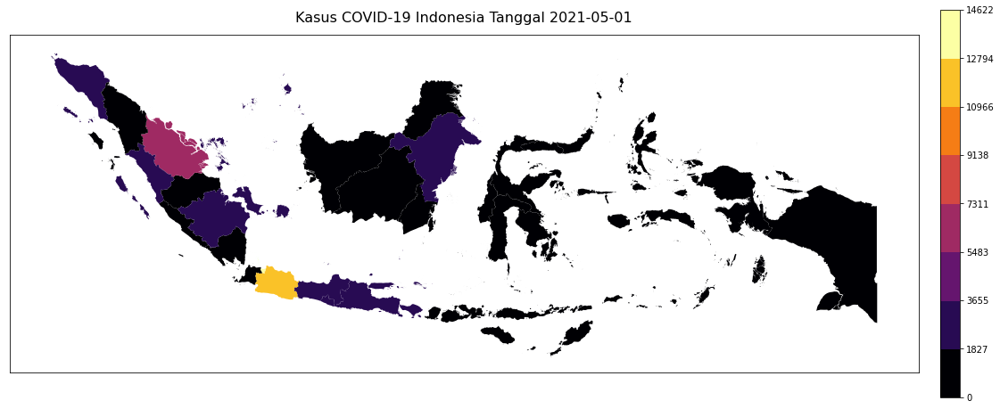

In [ ]:
sm = plt.cm.ScalarMappable(cmap=cm.get_cmap('inferno', 8), norm=plt.Normalize(
    vmin=max_var, 
    vmax=min_var,
))

fig, ax = plt.subplots(1, figsize=(22, 8))
cbar_plot()

df_covid_indonesia_sample.plot(column='KASUS', linewidth=0.8, ax=ax, cmap=cm.get_cmap('inferno', 8))

ax.axes.get_xaxis().set_visible(False)
ax.axes.get_yaxis().set_visible(False)

plt.title('Kasus COVID-19 Indonesia Tanggal 2021-05-01', fontsize=16, pad=14)
plt.show()

In [126]:
date_range = [d.strftime('%Y-%m-%d') for d in pd.date_range('20210501','20210920')]
date_range[0:5]

['2021-05-01', '2021-05-02', '2021-05-03', '2021-05-04', '2021-05-05']

In [127]:
def save_plot(anim_path, variable, date, max_var, min_var):
    df_covid = df_covid_indonesia.loc[df_covid_indonesia['tanggal'] == date_range[i]]

    sm = plt.cm.ScalarMappable(
         cmap=cm.get_cmap('inferno', 8),
         norm = plt.Normalize(
            vmin=max_var, 
            vmax=min_var
    ))

    fig, ax = plt.subplots(1, figsize=(22, 8))
    cbar = fig.colorbar(sm, pad=0.02)

    m0=int(np.floor(max_var))           
    m8=int(np.ceil(min_var))    

    m1=int(1*(m8-m0)/8.0 + m0)              
    m2=int(2*(m8-m0)/8.0 + m0)               
    m3=int(3*(m8-m0)/8.0 + m0)             
    m4=int(4*(m8-m0)/8.0 + m0) 
    m5=int(5*(m8-m0)/8.0 + m0)
    m6=int(6*(m8-m0)/8.0 + m0)
    m7=int(7*(m8-m0)/8.0 + m0)

    cbar.set_ticks([m0,m1,m2,m3,m4,m5,m6,m7,m8])
    cbar.set_ticklabels([m0,m1,m2,m3,m4,m5,m6,m7,m8])

    df_covid.plot(column=variable, linewidth=0.8, ax=ax, cmap=cm.get_cmap('inferno', 8))
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    
    filename = f'{anim_path}/{date}.png'

    plt.title(f'Kasus COVID-19 Indonesia Tanggal {date}', fontsize=16, pad=16)
    plt.savefig(filename, bbox_inches="tight", pad_inches=0.1)
    plt.close(fig)

    return filename

In [128]:
animation_path = pathlib.Path("animation/")
animation_path.mkdir(parents=True, exist_ok=True)

image_files = []

for i in tqdm(range(len(date_range))):
    file_name = save_plot(animation_path, 'KASUS', date_range[i], max_var, min_var)
    image_files.append(file_name)

100%|██████████| 143/143 [04:41<00:00,  1.97s/it]


In [129]:
images = []

for file_name in image_files:
    images.append(imageio.imread(file_name))

gif_path = "covid_indonesia_animation.gif"
imageio.mimsave(gif_path, images, fps=3)

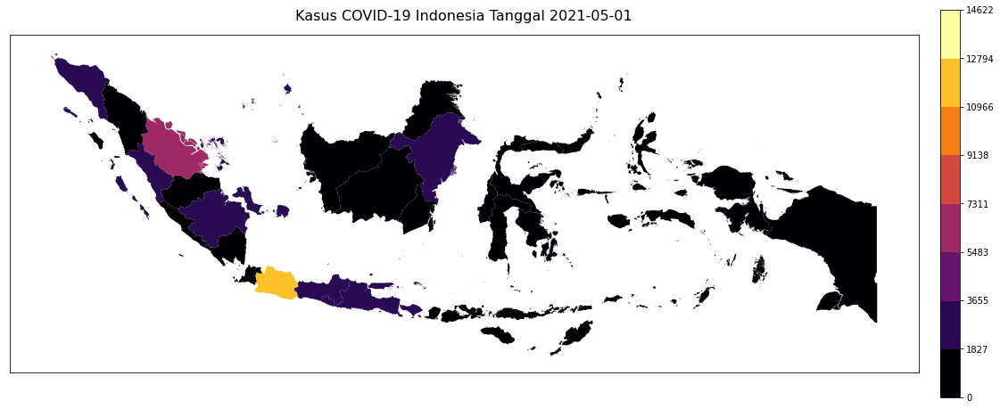

In [130]:
from IPython.display import Image
Image(open('/content/movie.gif','rb').read())